In [2]:
import numpy as np
import pandas as pd

import re
import string # for text cleaning
import contractions # for expanding short form words
from tqdm import tqdm
tqdm.pandas(desc="Progress Bar")

import torch
from datasets import load_dataset
from transformers import DistilBertTokenizer, DistilBertModel
from sklearn.metrics.pairwise import cosine_similarity

In [3]:
df = pd.read_csv("/Users/samyukthaganesh/Documents/Samyuktha/University/MachineLearning/SEM7Project/pdf_extracted_skills_education.csv")

In [4]:
df.shape

(2484, 4)

In [5]:
df.columns

Index(['Skills', 'Education', 'ID', 'Category'], dtype='object')

In [6]:
df.isna().sum()


Skills        91
Education    590
ID             0
Category       0
dtype: int64

In [7]:
print(df[(df.Skills.isna() & df.Education.isna())])


     Skills Education        ID                Category
145     NaN       NaN  17021141                ADVOCATE
367     NaN       NaN  31225895                 APPAREL
407     NaN       NaN  14248724                    ARTS
802     NaN       NaN  12632728    BUSINESS-DEVELOPMENT
1047    NaN       NaN  14849103            CONSTRUCTION
1270    NaN       NaN  14014749                DESIGNER
1357    NaN       NaN  90066849                DESIGNER
1492    NaN       NaN  20566550             ENGINEERING
1723    NaN       NaN  17576030                 FITNESS
1738    NaN       NaN  21178545                 FITNESS
1802    NaN       NaN  77266989                 FITNESS
1829    NaN       NaN  15499825              HEALTHCARE
2078    NaN       NaN  20237244  INFORMATION-TECHNOLOGY
2116    NaN       NaN  29051656  INFORMATION-TECHNOLOGY
2290    NaN       NaN  16280971                   SALES


In [8]:

print(df[~(df['Skills'].isna() & df['Education'].isna())].shape)

cv_df = df[~(df['Skills'].isna() & df['Education'].isna())].reset_index(drop=True)
cv_df.head()

(2469, 4)


,Skills,Education,ID,Category
0,Accounting; General Accounting; Accounts Payab...,Northern Maine Community College 1994 Associat...,10554236,ACCOUNTANT
1,"accounting, accounts payable, Accounts Receiva...","Bachelor of Science : Accounting , May 2010 Un...",10674770,ACCOUNTANT
2,"accounts payables, accounts receivables, Accou...",Computer Applications Specialist Certificate P...,11163645,ACCOUNTANT
3,"accounting, balance sheet, budgets, client, cl...","EMORY UNIVERSITY, Goizueta Business School 5 2...",11759079,ACCOUNTANT
4,Aderant/CMS Financial reporting,Bachelor of Business Administration : Accounti...,12065211,ACCOUNTANT


In [9]:
cv_df[cv_df.Skills.isna()]


,Skills,Education,ID,Category
7,NaN,"Bachelor of Science , Accounting Strayer Unive...",12442909,ACCOUNTANT
23,NaN,University of Phoenix Masters of Business Admi...,15363277,ACCOUNTANT
46,NaN,"Masters , Accounting University of Florida ï¼​...",21794875,ACCOUNTANT
76,NaN,High School Diploma : Business Management/Acco...,27637576,ACCOUNTANT
115,NaN,Bachelor of Arts : Economics City College of N...,82649935,ACCOUNTANT
...,...,...,...,...
2242,NaN,Master of Journalism : PR/Integrated Communica...,59346975,PUBLIC-RELATIONS
2245,NaN,B.A : Marketing June 2005 Berkeley College Mar...,75329822,PUBLIC-RELATIONS
2387,NaN,Plans.\nApplied progressive teaching principle...,17481570,TEACHER
2417,NaN,"Ph.D. : Philosophy in Education , 2019\nNorthc...",27126818,TEACHER


In [10]:
cv_df[cv_df.Education.isna()]


,Skills,Education,ID,Category
11,Budget forecasting expertise General ledger ac...,NaN,13130984,ACCOUNTANT
13,Full Accounting cycle Auditing,NaN,13491889,ACCOUNTANT
20,"account reconciliations, Accounting, accruals,...",NaN,14491649,ACCOUNTANT
29,"Accounting, billing, Change Management, contra...",NaN,17407184,ACCOUNTANT
31,Analytical reasoning Effective time management,NaN,18132924,ACCOUNTANT
...,...,...,...,...
2442,"Anatomy, Arts, EMR software, front office, inj...",NaN,37402097,TEACHER
2446,Behavior modeling Troubleshooting,NaN,45987048,TEACHER
2453,"Computer literate, drivers, listening, natural...",NaN,58708773,TEACHER
2458,â€¢ Well versed with the standards of hygiene ...,NaN,69005326,TEACHER


In [11]:
cv_df.Category.value_counts()


Category
BUSINESS-DEVELOPMENT      119
ACCOUNTANT                118
INFORMATION-TECHNOLOGY    118
FINANCE                   118
CHEF                      118
ENGINEERING               117
AVIATION                  117
ADVOCATE                  117
SALES                     115
CONSULTANT                115
BANKING                   115
FITNESS                   114
HEALTHCARE                114
CONSTRUCTION              111
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  105
ARTS                      102
TEACHER                   102
DIGITAL-MEDIA              96
APPAREL                    96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: count, dtype: int64

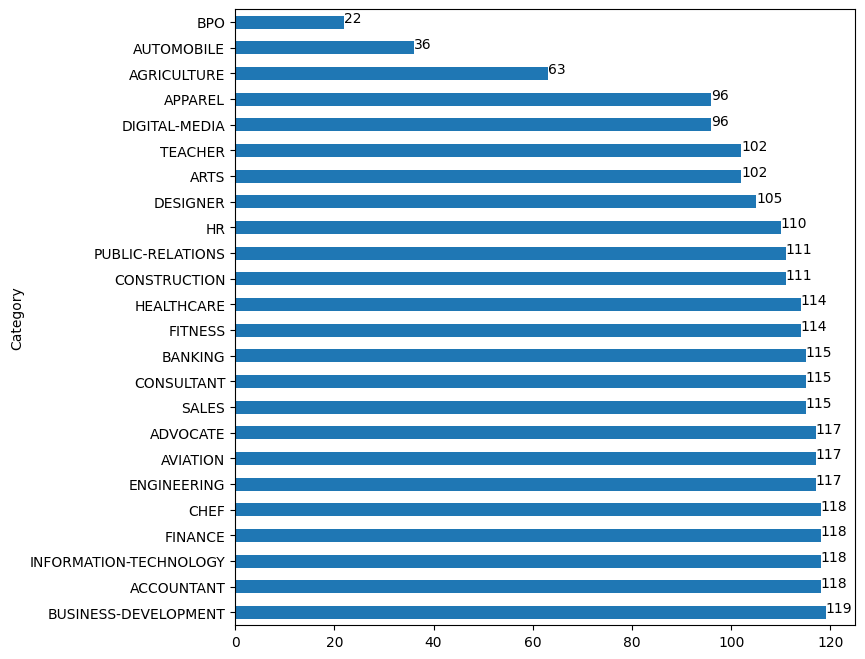

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))

cv_df.Category.value_counts().plot(kind='barh')

for index, value in enumerate(cv_df.Category.value_counts().values):
    plt.text(value, index, str(value))
    
plt.show();

In [13]:
def text_cleaning(text:str) -> str:
    if pd.isnull(text):
        return
    
    # lower-case everything
    text = text.lower().strip()
    
    # For removing puctuations
    translator = str.maketrans('', '', string.punctuation)
    
    # expand all the short-form words
    text = contractions.fix(text)
    
    # remove any special chars
    text = re.sub(r'http\S+|www\S+|https\S+', '', text) # Remove URLs
    text = re.sub(r'\S+@\S+', '', text) # Remove emails
    text = re.sub(r'\b\d{1,3}[-./]?\d{1,3}[-./]?\d{1,4}\b', '', text) # Remove phone numbers
    text = text.translate(translator) # Remove puctuations
    text = re.sub(r'[^a-zA-Z]', ' ', text) # Remove other non-alphanumeric characters
    
    return text.strip()

In [14]:
# Let's stitch together Skills & Education, similar to given in job description.
resume_df = cv_df.copy()

# Filling the null values in Skills & Education with Empty String before concatinating them
resume_df = resume_df.fillna(value='')

resume_df['CV'] = resume_df['Skills'] + ' ' + resume_df['Education']
resume_df['CV'] = resume_df['CV'].progress_apply(text_cleaning)

Progress Bar: 100%|██████████| 2469/2469 [00:00<00:00, 5728.17it/s]


In [15]:
resume_df.head(5)

,Skills,Education,ID,Category,CV
0,Accounting; General Accounting; Accounts Payab...,Northern Maine Community College 1994 Associat...,10554236,ACCOUNTANT,accounting general accounting accounts payable...
1,"accounting, accounts payable, Accounts Receiva...","Bachelor of Science : Accounting , May 2010 Un...",10674770,ACCOUNTANT,accounting accounts payable accounts receivabl...
2,"accounts payables, accounts receivables, Accou...",Computer Applications Specialist Certificate P...,11163645,ACCOUNTANT,accounts payables accounts receivables account...
3,"accounting, balance sheet, budgets, client, cl...","EMORY UNIVERSITY, Goizueta Business School 5 2...",11759079,ACCOUNTANT,accounting balance sheet budgets client client...
4,Aderant/CMS Financial reporting,Bachelor of Business Administration : Accounti...,12065211,ACCOUNTANT,aderantcms financial reporting bachelor of bus...


In [16]:
!pip install seaborn

In [17]:
category_stats = []

for category in resume_df['Category'].unique():
    category_wise_cv = resume_df[resume_df['Category'] == category]['CV']
    stats = category_wise_cv.str.split().str.len().describe(percentiles=[0.05, 0.5, 0.8, 0.9, 0.95])
    category_stats.append({'Category': category, **stats.to_dict()})

stats_df = pd.DataFrame(category_stats)

# Display the resulting DataFrame
stats_df

,Category,count,mean,std,min,5%,50%,80%,90%,95%,max
0,ACCOUNTANT,118.0,53.762712,77.190372,1.0,3.85,37.5,72.0,92.0,113.95,710.0
1,ADVOCATE,117.0,50.632479,60.125816,2.0,3.00,37.0,69.8,89.4,137.80,532.0
2,AGRICULTURE,63.0,95.619048,160.796649,2.0,6.20,51.0,110.0,153.2,297.80,985.0
3,APPAREL,96.0,50.364583,107.048451,1.0,3.00,34.0,59.0,77.0,102.75,1049.0
4,ARTS,102.0,101.333333,164.892424,1.0,5.05,50.5,106.6,156.6,482.75,893.0
5,AUTOMOBILE,36.0,39.916667,29.792017,0.0,2.50,35.5,64.0,71.0,98.00,115.0
6,AVIATION,117.0,71.871795,112.382777,2.0,3.00,41.0,86.6,147.8,269.80,879.0
7,BANKING,115.0,77.539130,159.677377,3.0,7.00,46.0,79.2,105.6,222.00,1487.0
8,BPO,22.0,53.818182,35.653940,2.0,14.05,48.5,71.2,87.9,121.25,156.0
9,BUSINESS-DEVELOPMENT,119.0,49.126050,37.023253,1.0,3.00,40.0,81.2,103.2,121.40,183.0


/var/folders/jr/sldj88z97w17cynm4xfw_kq40000gn/T/ipykernel_90580/3222102862.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=stats_df, x='Category', y='mean', palette='viridis')


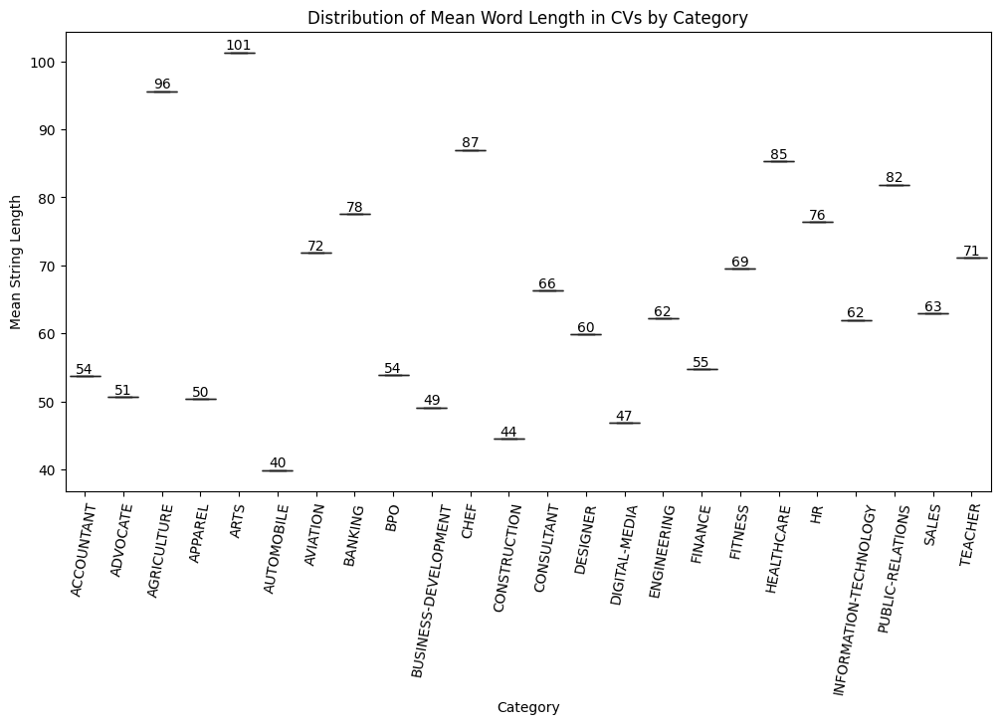

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a box plot to visualize the distribution of string lengths for each category
plt.figure(figsize=(12, 6))
sns.boxplot(data=stats_df, x='Category', y='mean', palette='viridis')

# Annotate the bars with actual values
for index, row in stats_df.iterrows():
    plt.text(index, row['mean'], f'{round(row["mean"])}', ha='center', va='bottom', fontsize=10)

plt.title('Distribution of Mean Word Length in CVs by Category')
plt.xticks(rotation=80)
plt.xlabel('Category')
plt.ylabel('Mean String Length')
plt.show();

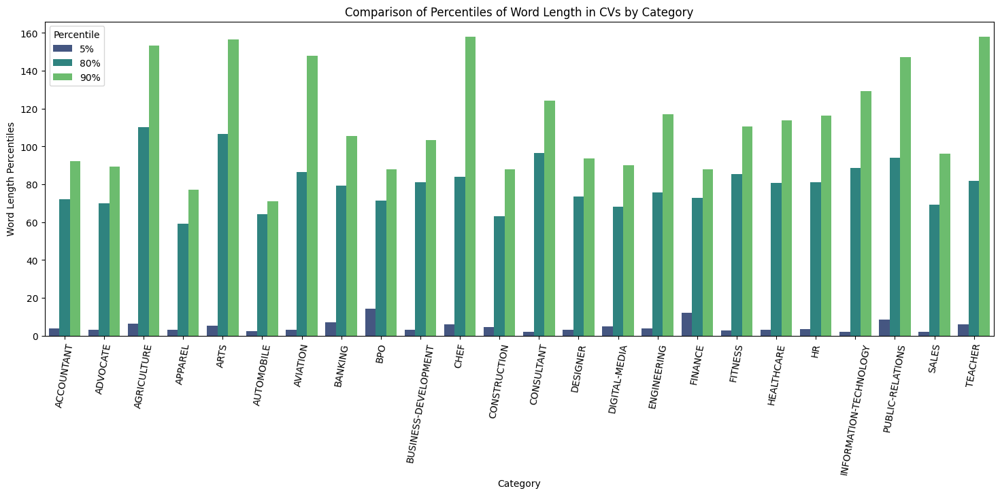

In [19]:
# Reshape the DataFrame to long format for easier plotting
stats_df_long = pd.melt(stats_df, id_vars=['Category'], value_vars=['5%', '80%', '90%'])

# Create a bar plot to compare percentiles of word length for each category
plt.figure(figsize=(18, 6))
sns.barplot(data=stats_df_long, x='Category', y='value', hue='variable', palette='viridis')

plt.title('Comparison of Percentiles of Word Length in CVs by Category')
plt.xticks(rotation=80)
plt.xlabel('Category')
plt.ylabel('Word Length Percentiles')
plt.legend(title='Percentile')
plt.show();


In [20]:
jd_df = pd.read_csv("/Users/samyukthaganesh/Documents/Samyuktha/University/MachineLearning/SEM7Project/training_data.csv")


In [21]:
resume_df

,Skills,Education,ID,Category,CV
0,Accounting; General Accounting; Accounts Payab...,Northern Maine Community College 1994 Associat...,10554236,ACCOUNTANT,accounting general accounting accounts payable...
1,"accounting, accounts payable, Accounts Receiva...","Bachelor of Science : Accounting , May 2010 Un...",10674770,ACCOUNTANT,accounting accounts payable accounts receivabl...
2,"accounts payables, accounts receivables, Accou...",Computer Applications Specialist Certificate P...,11163645,ACCOUNTANT,accounts payables accounts receivables account...
3,"accounting, balance sheet, budgets, client, cl...","EMORY UNIVERSITY, Goizueta Business School 5 2...",11759079,ACCOUNTANT,accounting balance sheet budgets client client...
4,Aderant/CMS Financial reporting,Bachelor of Business Administration : Accounti...,12065211,ACCOUNTANT,aderantcms financial reporting bachelor of bus...
...,...,...,...,...,...
2464,Highly Effective TeacherÂ,University of South Florida 2002 Bachelor of S...,86322251,TEACHER,highly effective teacher university of south ...
2465,Human resource laws knowledge,Bachelor of Science : Interdisciplinary Studie...,86597425,TEACHER,human resource laws knowledge bachelor of scie...
2466,"conflict resolution, course development, criti...","University of Phoenix, 2007 Master of Arts : E...",90363254,TEACHER,conflict resolution course development critica...
2467,"CPR, Creative thinking, delivery, First Aid, p...",Conflict resolution techniques\nTraining in fo...,96547039,TEACHER,cpr creative thinking delivery first aid polic...


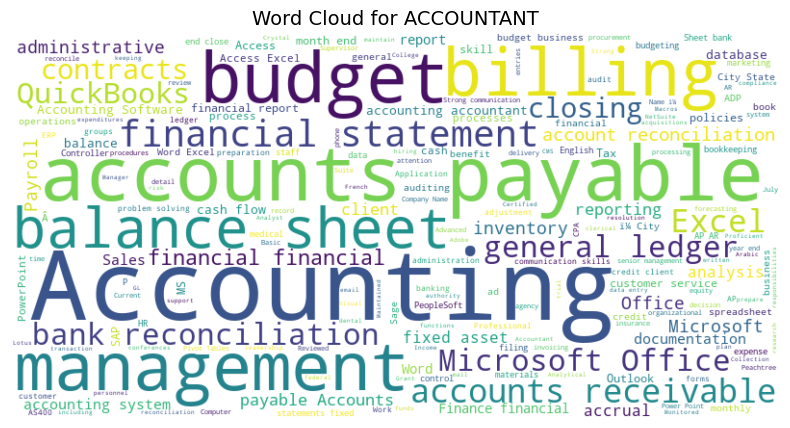

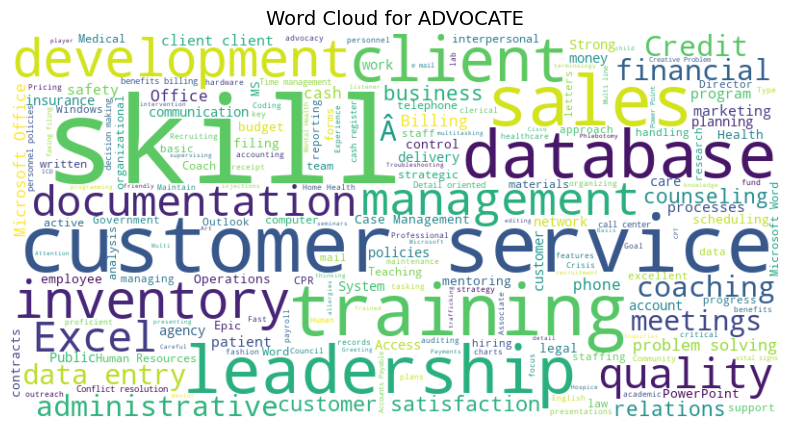

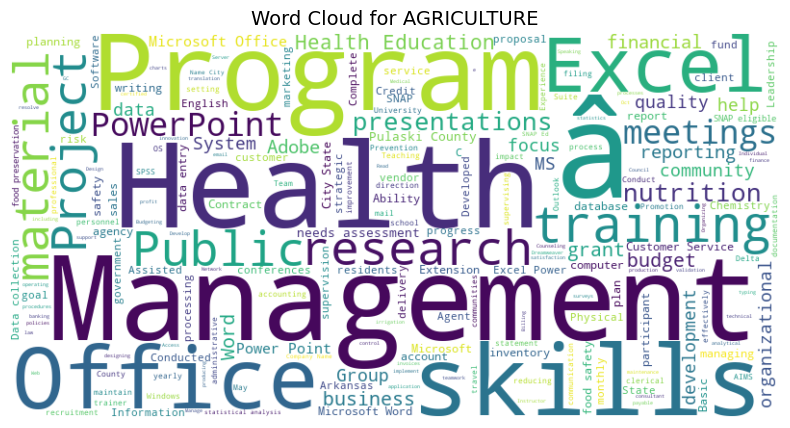

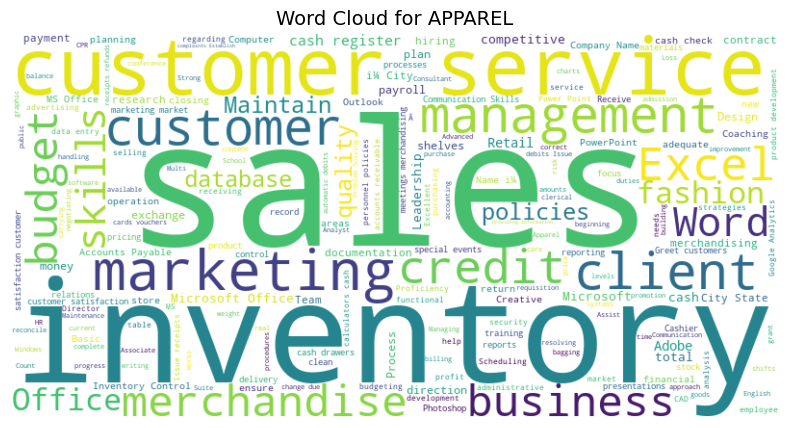

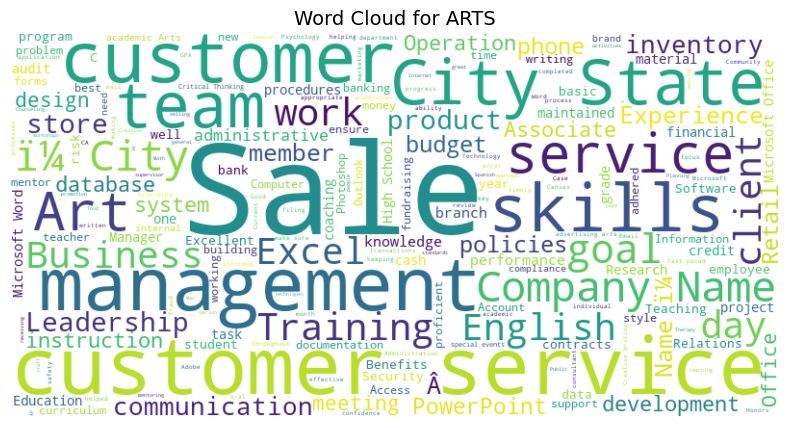

...

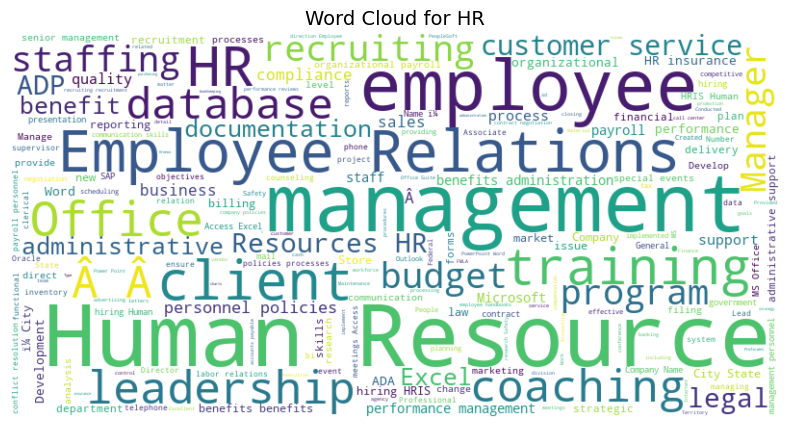

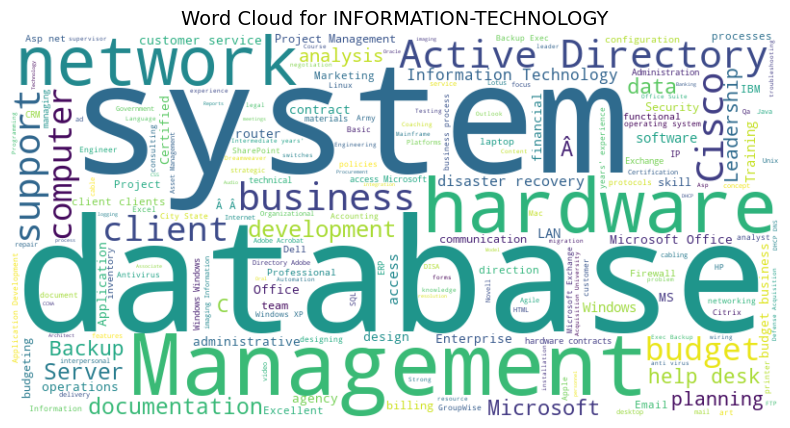

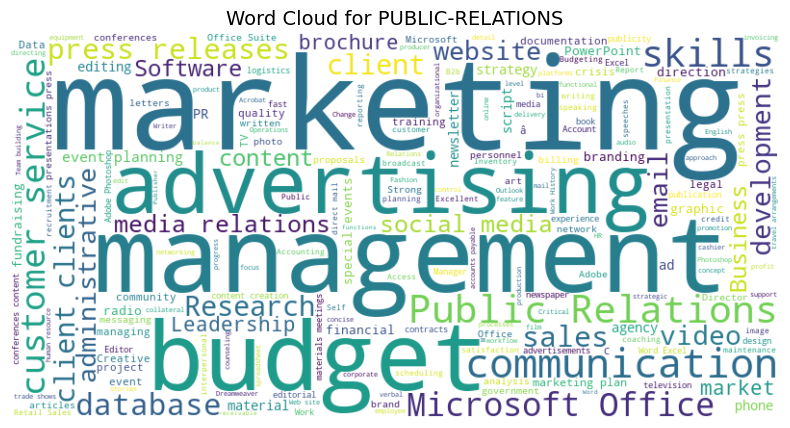

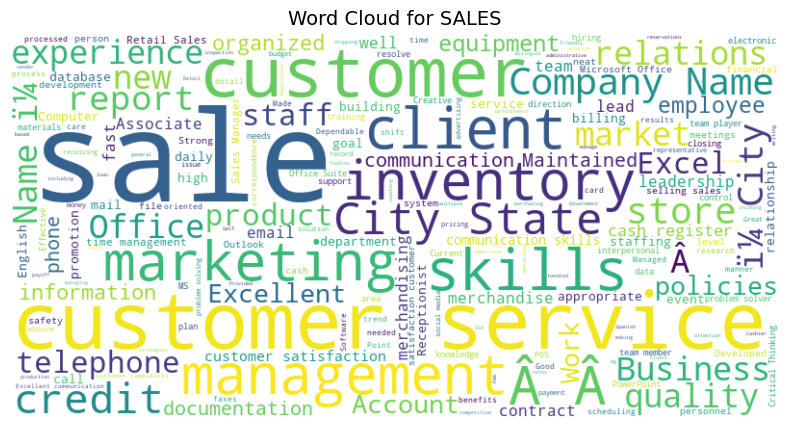

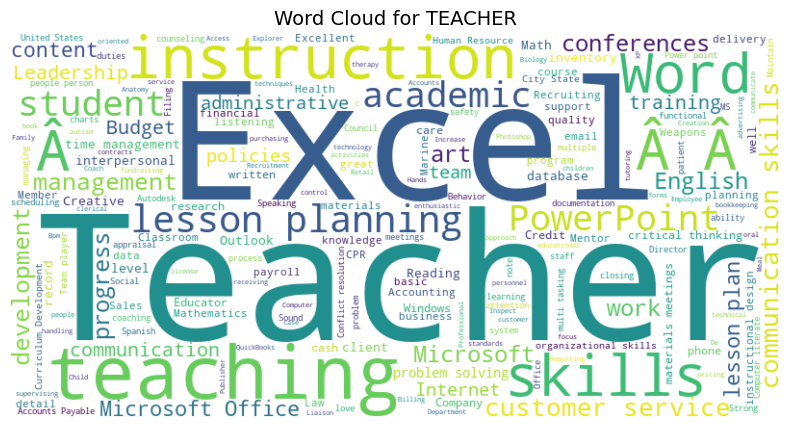

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate WordCloud for each category
for category in resume_df['Category'].unique():
    skills_text = " ".join(resume_df[resume_df['Category'] == category]['Skills'].dropna())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(skills_text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {category}', fontsize=14)
    plt.axis('off')
    plt.show()


/var/folders/jr/sldj88z97w17cynm4xfw_kq40000gn/T/ipykernel_90580/3698026077.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=skills_by_category.index, y=skills_by_category.values, palette='viridis')


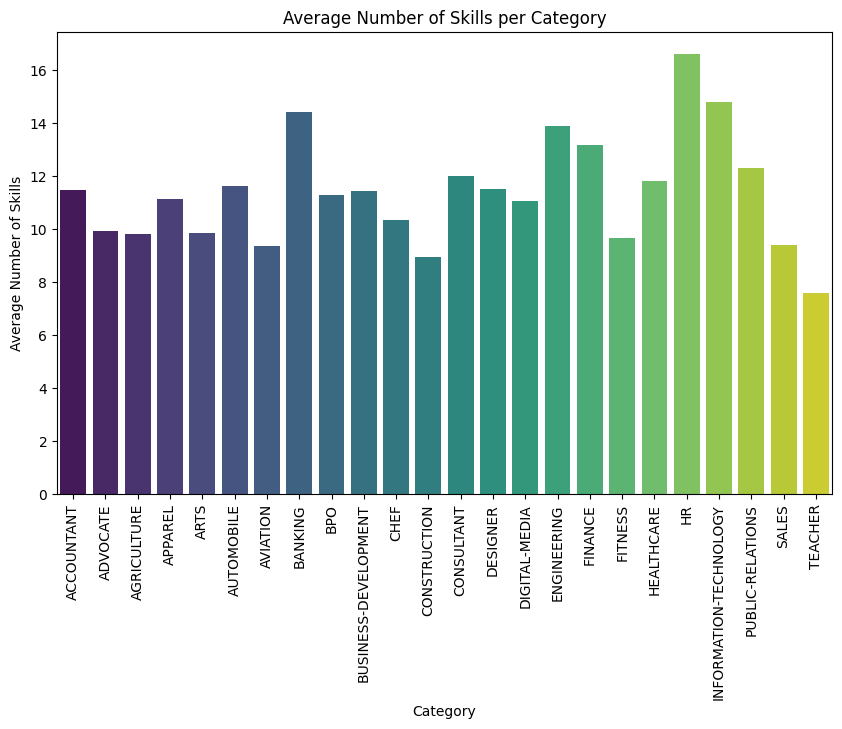

In [23]:
import seaborn as sns

# Count unique skills per category
resume_df['Skill_Count'] = resume_df['Skills'].apply(lambda x: len(str(x).split(',')))
skills_by_category = resume_df.groupby('Category')['Skill_Count'].mean()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=skills_by_category.index, y=skills_by_category.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Average Number of Skills per Category')
plt.xlabel('Category')
plt.ylabel('Average Number of Skills')
plt.show()


In [32]:
!pip install squarify